In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
sc.logging.print_header()

from matplotlib import rcParams

import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('default')  

#-- 
#https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

import warnings
warnings.filterwarnings('ignore')

#-- -colors for DCs
col_ids =['tomato','paleturquoise','cornflowerblue','mediumseagreen','mediumpurple',
          'goldenrod','lightgreen','palevioletred','lightsalmon','thistle', #0-9
          "brown","plum","lightskyblue","yellowgreen","mediumorchid","mediumturquoise","peru",
          "#bf812d","mediumaquamarine","lightslategrey","dodgerblue","#4daf4a",'#377eb8','#dd1c77']

col_pGroups = ["#d8daeb", "#9e9ac8", "#54278f","#66bd63"]
col_groups = ["#9e9ac8","#66bd63"]

import warnings
warnings.filterwarnings('ignore')

2024-08-26 09:45:45.289909: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-26 09:45:45.334113: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-26 09:45:45.335134: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-26 09:45:47.195219: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


scanpy==1.9.6 anndata==0.9.2 umap==0.5.6 numpy==1.24.3 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.10.8 pynndescent==0.5.13


In [2]:
sc.settings.set_figure_params(dpi=80)

In [3]:
#-- -colors for DCs

col_ids =['tomato','paleturquoise','cornflowerblue','mediumseagreen','mediumpurple',
          'goldenrod','lightgreen','palevioletred','lightsalmon','thistle', #0-9
          "brown","plum","lightskyblue","yellowgreen","mediumorchid","mediumturquoise","peru",
          "#bf812d","mediumaquamarine","lightslategrey","dodgerblue","#4daf4a",'#377eb8']

col_groups=[ "#9e9ac8","#66c2a4"]

col_pGroups = ["#d8daeb", "#9e9ac8", "#54278f","#66bd63"]


## CD14 monocytes 

In [4]:
CD14_mono=sc.read('../Subclusters/H5AD/CD14_mono_cleaned_pCov40_11232021.h5ad')
CD14_mono

AnnData object with n_obs × n_vars = 16906 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'CD14_mono_Res1', 'CD14_mono_Res0_8', 'CD14_mono_Res0_6', 'CD14_mono_Res0_4', 'IL1B_IFI27', 'IL1B_ISG15', 'IL1B_XAF1', 'CXCL8_IFI27', 'CXCL8_ISG15', 'CXCL8_XAF1', 'Merged_SCs', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'CXCL8_IFI27_colors', 'CXCL8_ISG15_colors', 'CXCL8_XAF1_colors', 'Groups_colors', 'IL1B_IFI27_colors', 'IL1B_ISG15_colors', 'IL1B_XAF1_colors', 'SCs_colors', 'dendrogram_SCs', 'neighbors', 'rank_genes_groups', 'runs_10X_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scal

In [5]:
CD14_mono.uns['Patient_groups_colors']= col_pGroups
CD14_mono.uns['Groups_colors']= col_groups

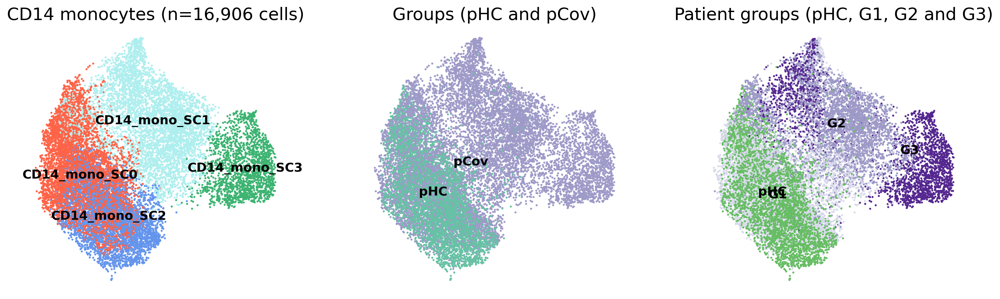

In [6]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(CD14_mono, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=18, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13,           
           title=['CD14 monocytes (n=16,906 cells)','Groups (pHC and pCov)','Patient groups (pHC, G1, G2 and G3)'])
           #save='_cleaned_CD14_mono_SCs_12162021.pdf')


## save DE

In [7]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(CD14_mono, 
                        'SCs', method='t-test', corr_method="bonferroni")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


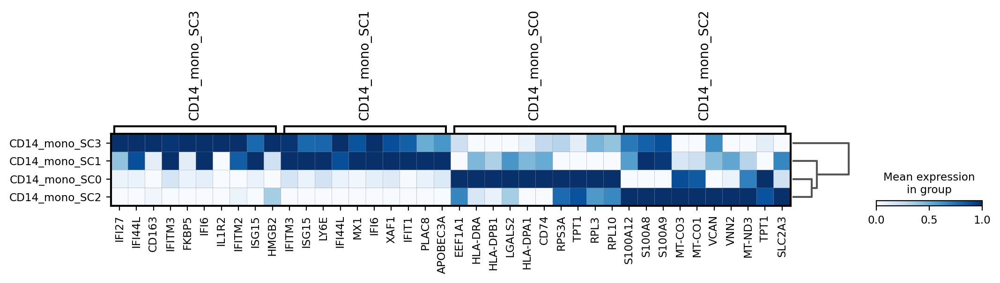

In [8]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(CD14_mono, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [9]:
result = CD14_mono.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_CD14_mono_SCs_t-Test_06292023.csv')
    

## CD16 monocytes 

In [10]:
CD16_mono=sc.read('../Subclusters/H5AD/CD16_mono_cleaned_pCov40_12012021.h5ad')
CD16_mono

AnnData object with n_obs × n_vars = 5987 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'CD16_mono_Res0_8', 'CD16_mono_Res0_6', 'CD16_mono_Res0_4', 'IL1B_IFI27', 'IL1B_ISG15', 'IL1B_XAF1', 'CXCL8_IFI27', 'CXCL8_ISG15', 'CXCL8_XAF1', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'SCs_colors', 'dendrogram_SCs', 'neighbors', 'rank_genes_groups', 'runs_10X_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [11]:
CD16_mono.uns['Patient_groups_colors']= col_pGroups
CD16_mono.uns['Groups_colors']= col_groups

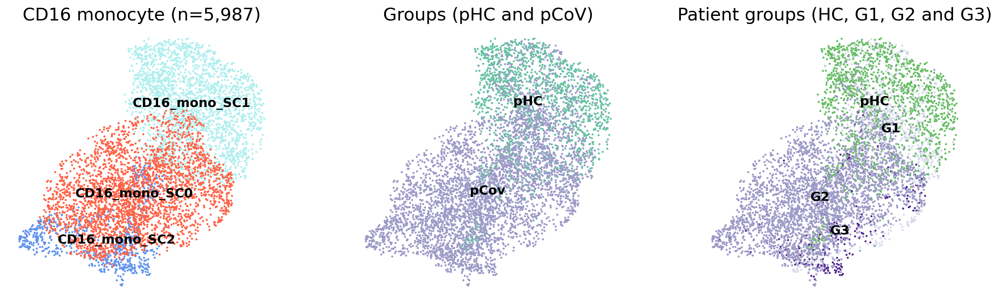

In [12]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(CD16_mono, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=18, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13, 
           title=['CD16 monocyte (n=5,987)', 'Groups (pHC and pCoV)', 'Patient groups (HC, G1, G2 and G3)'])

In [13]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(CD16_mono, 
                        'SCs', method='t-test', corr_method="bonferroni")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


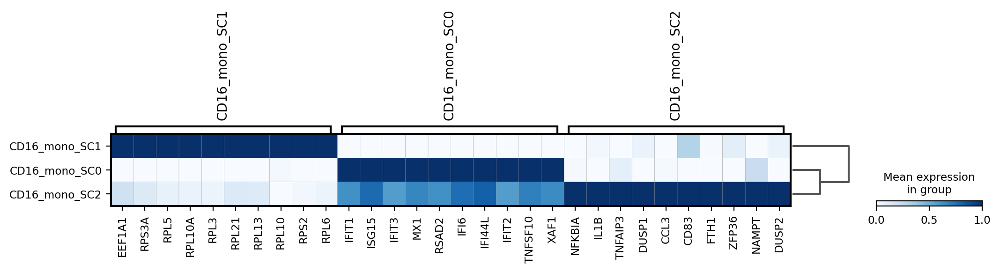

In [14]:
matplotlib.style.use('default')  
axs = sc.pl.rank_genes_groups_matrixplot(CD16_mono, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [15]:
result = CD16_mono.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_CD16_mono_SCs_t-Test_06292023.csv')
    

## cDC

In [16]:
cDC=sc.read('../Subclusters/H5AD/cDC_pCov40_120492021.h5ad')
cDC

AnnData object with n_obs × n_vars = 440 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'CD14_mono_Res1', 'CD14_mono_Res0_8', 'CD14_mono_Res0_6', 'CD14_mono_Res0_4', 'IL1B_IFI27', 'IL1B_ISG15', 'IL1B_XAF1', 'CXCL8_IFI27', 'CXCL8_ISG15', 'CXCL8_XAF1', 'Merged_SCs', 'SCs', 'cDC_Res0_4', 'cDC_Res0_6', 'cDC_Res0_8', 'cDC_Res1'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'SCs_colors', 'dendrogram_SCs', 'dendrogram_cDC_Res0_6', 'neighbors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [17]:
cDC.uns['Patient_groups_colors']= col_pGroups
cDC.uns['Groups_colors']= col_groups

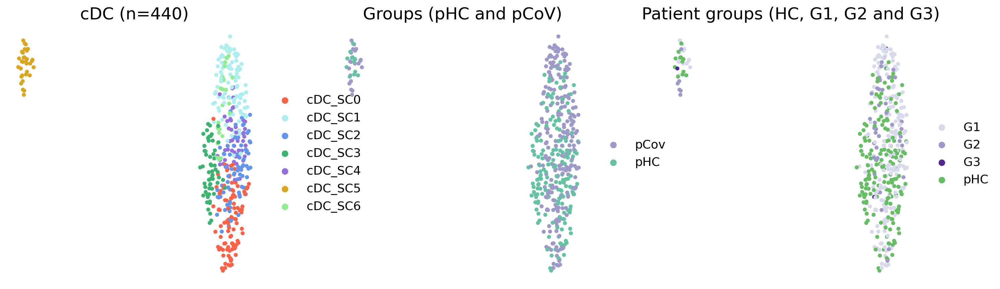

In [18]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(cDC, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=75, #***
           frameon=False,
           ncols=3,
           #legend_loc='on data',  
           legend_fontsize=13,
          title=['cDC (n=440)', 'Groups (pHC and pCoV)', 'Patient groups (HC, G1, G2 and G3)'])
          # save='_cleaned_cDC_SCs_v2_12042021.pdf')

In [19]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(cDC, 
                        'SCs', method='t-test', corr_method="bonferroni")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


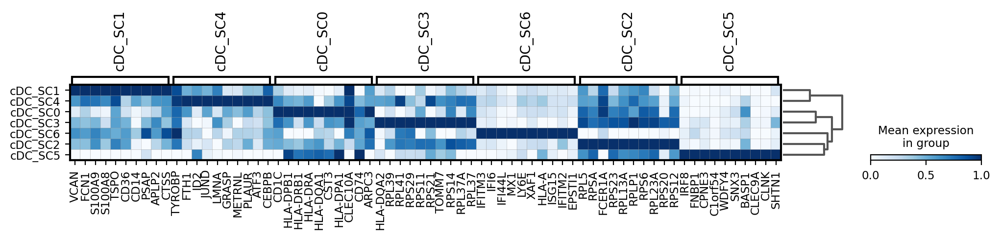

In [20]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(cDC, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [21]:
result = cDC.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_cDC_SCs_t-Test_06292023.csv')
    

## pDC

In [22]:
pDC=sc.read('../Subclusters/H5AD/pDC_cleaned_pCov40_11232021.h5ad')
pDC

AnnData object with n_obs × n_vars = 386 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Fig_ids_Groups', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'pDCs_Res0_4', 'pDCs_Res0_6', 'pDCs_Res0_8', 'SCs', 'pDC_Res0_4', 'pDC_Res0_6', 'pDC_Res0_8'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'SCs_colors', "dendrogram_['SCs']", "dendrogram_['pDCs_Res0_4']", 'leiden', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [23]:
pDC.uns['Patient_groups_colors']= col_pGroups
pDC.uns['Groups_colors']= col_groups

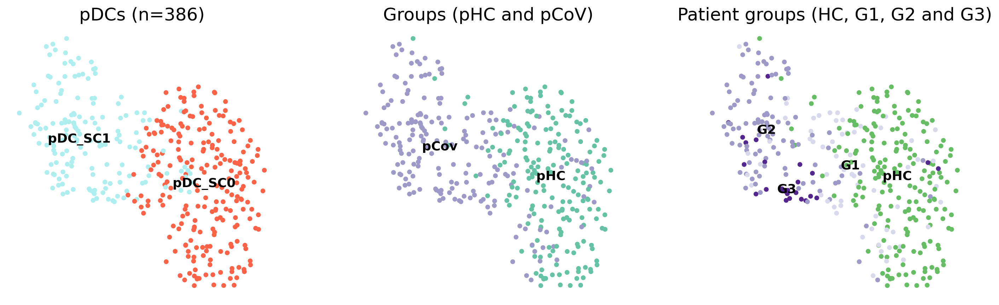

In [24]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(pDC, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=95, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13, 
           title=['pDCs (n=386)', 'Groups (pHC and pCoV)', 'Patient groups (HC, G1, G2 and G3)'])
           #save='_cleaned_pDC_cleaned_SCs_12032021.pdf')


In [25]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(pDC, 
                        'SCs', method='t-test', corr_method="bonferroni")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


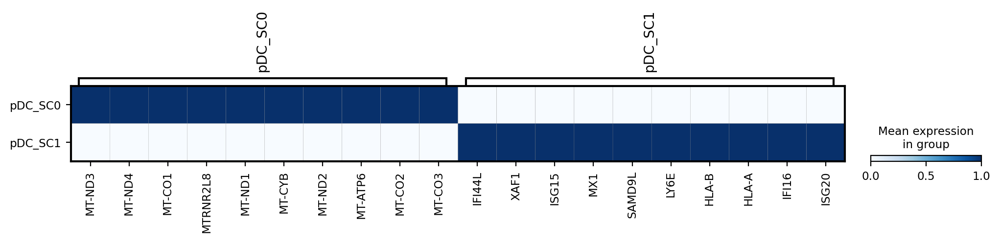

In [26]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(pDC, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))


In [27]:
result = pDC.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_pDC_SCs_t-Test_06292023.csv')
    

## CD4 T cells 

In [28]:
CD4_T=sc.read('../Subclusters/H5AD/CD4_cleaned_pCov40_11232021.h5ad')
CD4_T

AnnData object with n_obs × n_vars = 100482 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'CD4_Res1', 'CD4_Res0_8', 'CD4_Res0_6', 'CD4_Res0_4', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'SCs_colors', 'dendrogram_SCs', 'neighbors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [29]:
CD4_T.uns['Patient_groups_colors']= col_pGroups
CD4_T.uns['Groups_colors']= col_groups

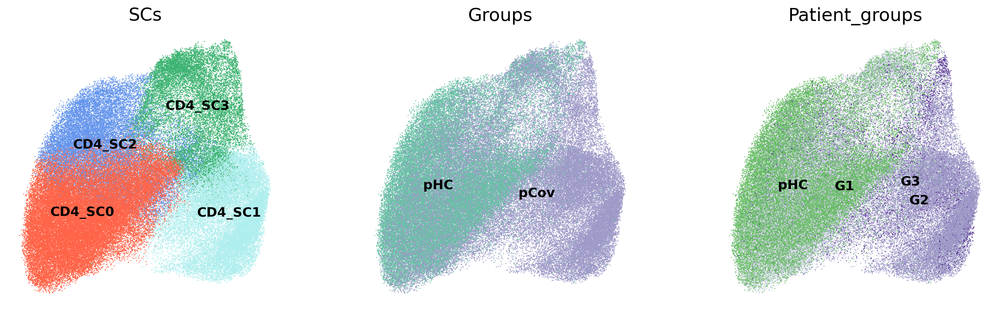

In [30]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(CD4_T, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=4, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13
           #title=['CD4 T cells (n=100,482 cells)','Groups (pHC and pCov)','Patient groups (pHC, G1, G2 and G3)'],
          )

In [31]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(CD4_T, 
                        'SCs', method='t-test', corr_method="bonferroni")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


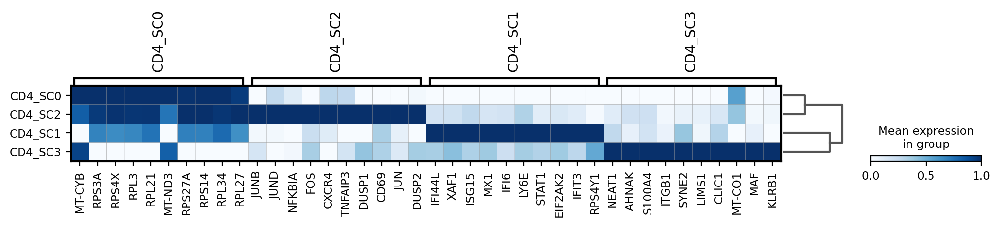

In [32]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(CD4_T, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [33]:
result = CD4_T.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_CD4_Tcells_SCs_t-Test_06292023.csv')
    

## CD8 T cells 

In [34]:
CD8_T=sc.read('../Subclusters/H5AD/CD8_Tcells_cleaned_pCoV40_070202021.h5ad')
CD8_T

AnnData object with n_obs × n_vars = 34366 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'CD8_Res1', 'CD8_Res0_8', 'CD8_Res0_6', 'CD8_Res0_4', 'SCs', 'SC2'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'Res1_2_AC_colors', 'Res1_2_bbknn_colors', 'SCs_colors', "dendrogram_['annotated_clusters']", 'leiden', 'neighbors', 'rank_genes_groups', 'runs_10x_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [35]:
CD8_T.uns['Patient_groups_colors']= col_pGroups
CD8_T.uns['Groups_colors']= col_groups

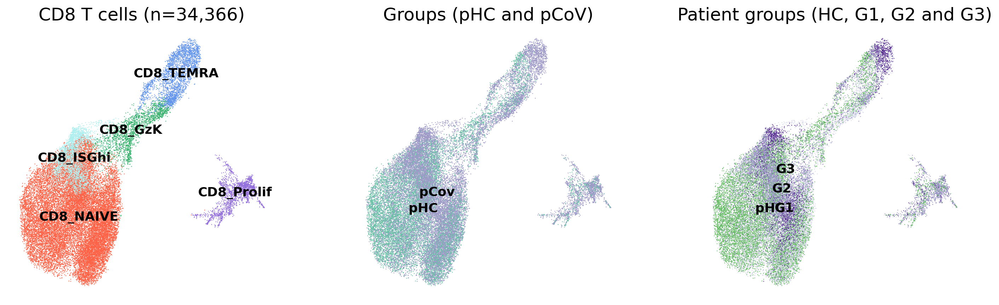

In [36]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(CD8_T, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=3, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13,
            title=['CD8 T cells (n=34,366)', 'Groups (pHC and pCoV)', 'Patient groups (HC, G1, G2 and G3)'])

In [37]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(CD8_T, 
                        'SCs', method='t-test', corr_method="bonferroni")



ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_SCs']`


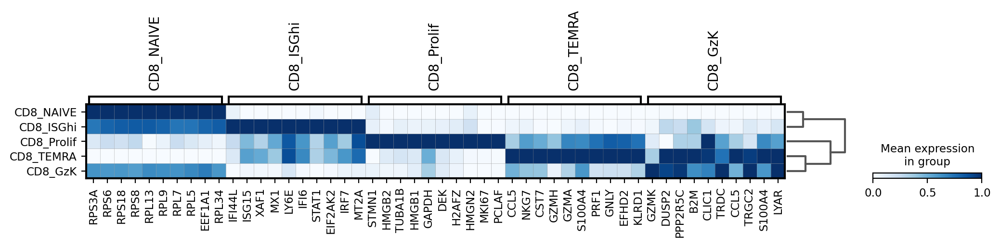

In [38]:

matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(CD8_T, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))




In [39]:
result = CD8_T.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_CD8_T_SCs_t-Test_06292023.csv')
    

## NK cells

In [40]:
NK=sc.read('../Subclusters/H5AD/NK_cleaned_pCov40_11232021.h5ad')
NK

AnnData object with n_obs × n_vars = 13403 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'NK_Res1', 'NK_Res0_8', 'NK_Res0_6', 'NK_Res0_4', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'SCs_colors', 'dendrogram_SCs', 'neighbors', 'rank_genes_groups', 'runs_10X_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [41]:
NK.uns['Patient_groups_colors']= col_pGroups
NK.uns['Groups_colors']= col_groups

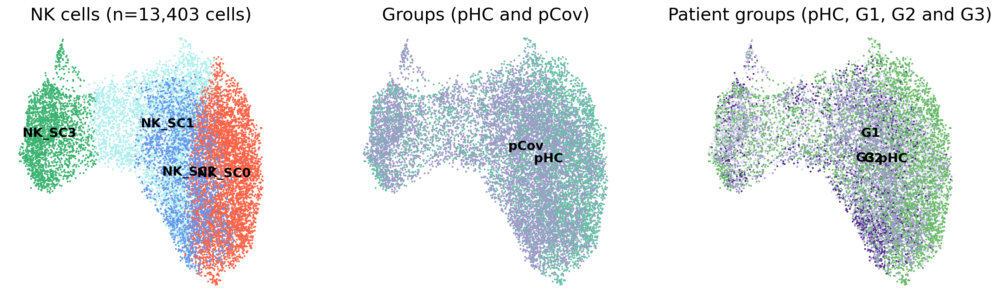

In [42]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(NK, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=15, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13,
           title=['NK cells (n=13,403 cells)','Groups (pHC and pCov)','Patient groups (pHC, G1, G2 and G3)'])

In [43]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(NK, 
                        'SCs', method='t-test', corr_method="bonferroni")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


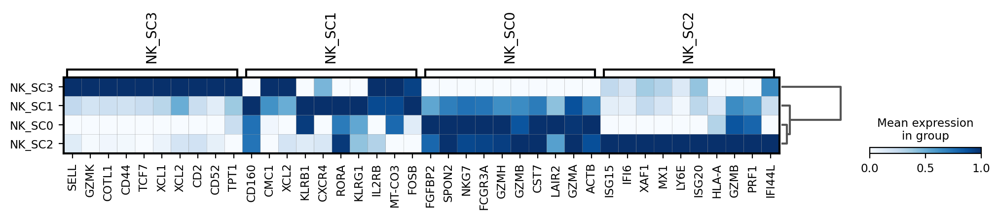

In [44]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(NK, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [45]:
result = NK.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_NK_SCs_t-Test_06292023.csv')
    

# B cells 

In [46]:
Bcells=sc.read('../Subclusters/H5AD/B_cells_cleaned_pCov40_11232021.h5ad')
Bcells

AnnData object with n_obs × n_vars = 30119 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'B_cells_Res0_4', 'B_cells_Res0_6', 'B_cells_Res0_8', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Patient_groups_colors', 'SCs_colors', 'dendrogram_SCs', 'neighbors', 'rank_genes_groups', 'runs_10X_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [47]:
Bcells.uns['Patient_groups_colors']= col_pGroups
Bcells.uns['Groups_colors']= col_groups

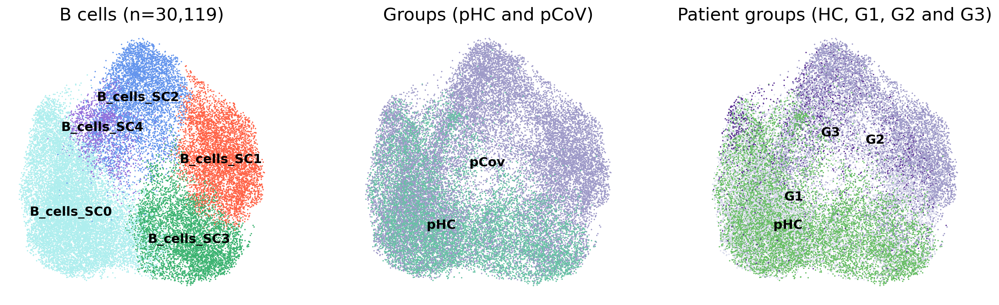

In [48]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(Bcells, 
           color=['SCs','Groups','Patient_groups'], 
           color_map='OrRd',
           size=8, #***
           frameon=False,
           legend_loc='on data',  
           legend_fontsize=13,
            title=['B cells (n=30,119)', 'Groups (pHC and pCoV)', 'Patient groups (HC, G1, G2 and G3)'])

In [49]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(Bcells, 
                        'SCs', method='t-test', corr_method="bonferroni")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


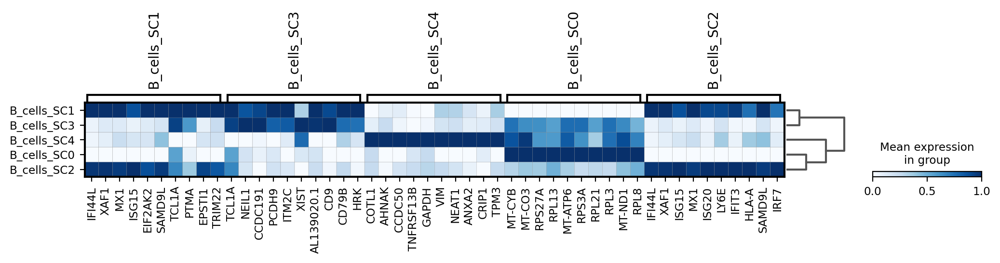

In [50]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(Bcells, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [51]:
result = Bcells.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_Bcells_SCs_t-Test_06292023.csv')

## MGK

In [52]:
MGK=sc.read('../Subclusters/H5AD/Mgk_cleaned_pCoV40_05202021.h5ad')
MGK

AnnData object with n_obs × n_vars = 713 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score', 'Mgk_Res1', 'Mgk_Res0_8', 'Mgk_Res0_6', 'Mgk_Res0_4', 'Merged_SCs', 'SCs'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Groups_colors', 'Mgk_Res0_4_colors', 'Mgk_Res0_6_colors', 'Res1_2_AC_colors', 'Res1_2_bbknn_colors', 'SCs_colors', 'dendrogram_Mgk_Res0_4', "dendrogram_['Mgk_Res0_4']", "dendrogram_['Mgk_Res0_6']", "dendrogram_['annotated_clusters']", 'leiden', 'neighbors', 'rank_genes_groups', 'runs_10X_colors', 'runs_10x_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 

In [53]:
MGK.uns['Patient_groups_colors']= col_pGroups
MGK.uns['Groups_colors']= col_groups

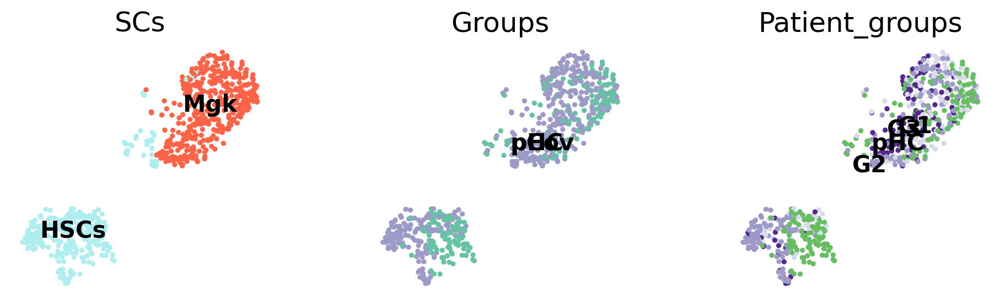

In [54]:
G=['SCs','Groups','Patient_groups']

matplotlib.style.use('default')  
rcParams['figure.figsize'] = (3,3)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(MGK, 
           color=G, 
           color_map='OrRd',
           size=45, #***
           frameon=False, ncols=3,
           legend_loc='on data')


In [55]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (6,4)
sc.tl.rank_genes_groups(MGK, 
                        'SCs', method='t-test', corr_method="bonferroni")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


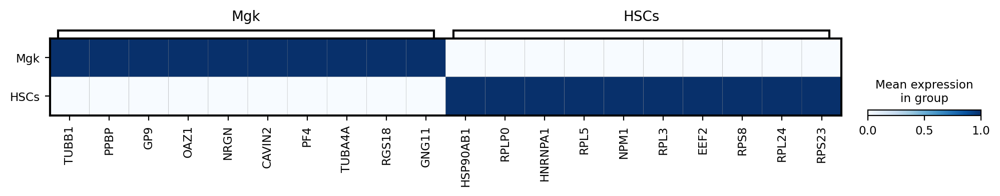

In [56]:
matplotlib.style.use('default')  

axs = sc.pl.rank_genes_groups_matrixplot(MGK, 
                                         n_genes=10, 
                                         standard_scale='var', 
                                         cmap='Blues', figsize=(12,1))

In [57]:
result = MGK.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).to_csv('../DE/DE_pCov40_MGK_SCs_t-Test_06292023.csv')
    